In [851]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
from math import *

In [1160]:
img1 = cv2.imread("/Users/arkadiuszdrag/Downloads/F_dzieciol.png")
img2 = cv2.imread("/Users/arkadiuszdrag/Downloads/sz_vimsodden.jpg")

In [1161]:
img_np1 = np.array(img1)
img_np2 = np.array(img2)

In [1162]:
img_np1 = cv2.cvtColor(img_np1, cv2.COLOR_BGR2RGB)

# ordfilt2

In [1135]:
def ordfilt2(A, order, domain_rows, domain_cols):

    for i in range(np.shape(A)[0]):
        for j in range(np.shape(A)[1]):

            elements = np.sort( A[i:domain_rows+i, j:domain_cols+j], axis=None )

            Z = np.copy(elements)

            if len(Z) < domain_rows + domain_cols:
                l_zeros = domain_rows + domain_cols - len(elements)
                for k in range(l_zeros):
                    Z = np.insert(Z, 0, 0)

            A[i,j] = Z[order-1]
    return A

In [868]:
np.shape(K1[:,:,1])

(1078, 1470)

In [1163]:
K1 = img_np1.copy()
    
for dim in range(3):
    K1[:,:,dim] = ordfilt2(K1[:,:,dim], 8, 7, 7)

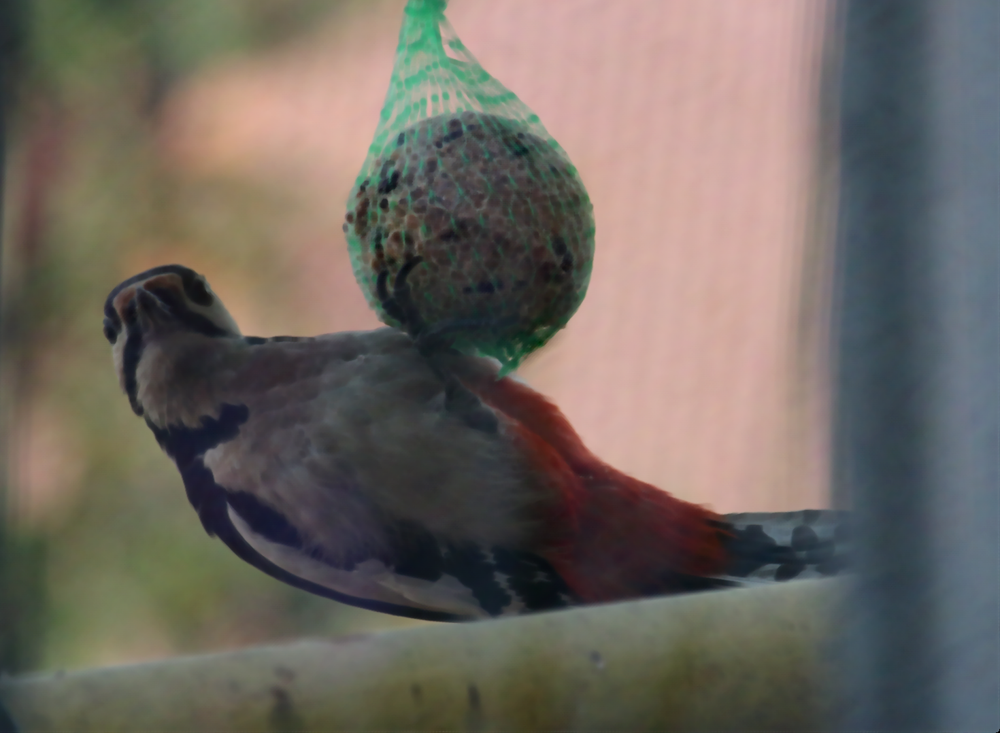

In [1164]:
Image.fromarray(np.uint8(K1))

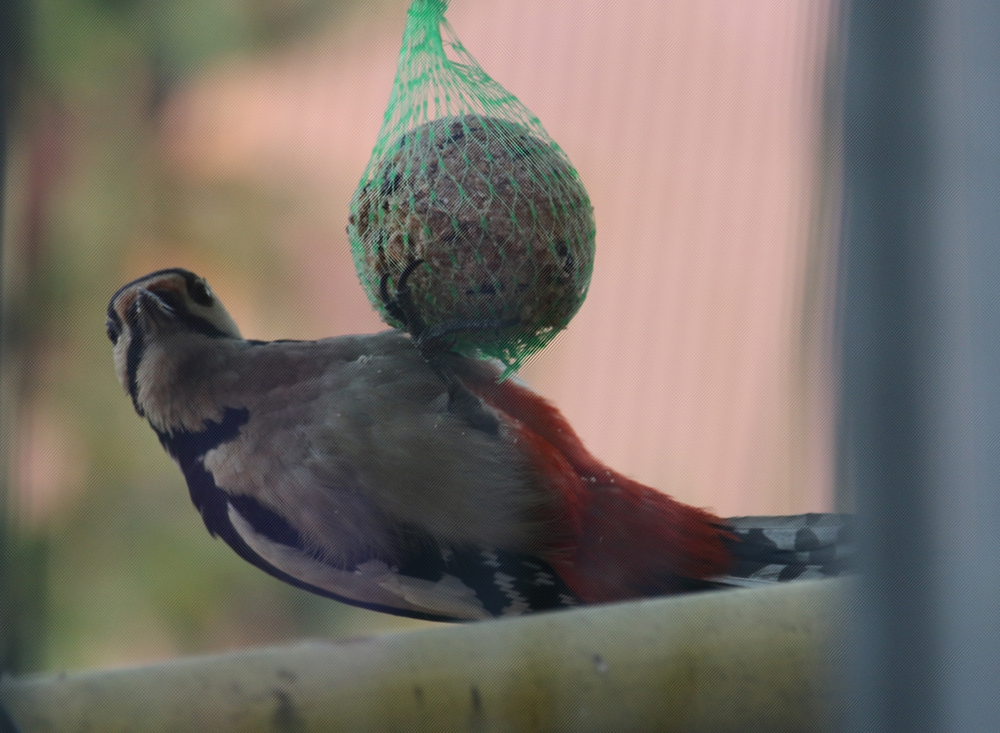

In [1165]:
Image.fromarray(np.uint8(img_np1))

In [1143]:
K2 = img_np2.copy()
K2 = ordfilt2(K2, 5, 5, 5)

im2 = Image.fromarray(np.uint8(K2))

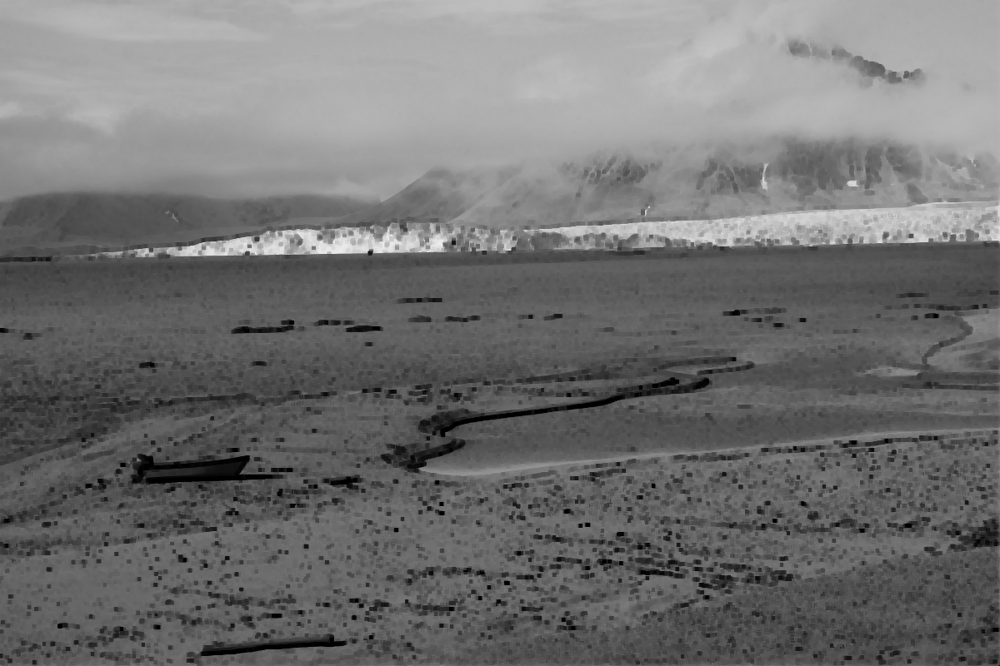

In [1144]:
im2

# Gradient morfologiczny

In [1166]:
img1 = Image.open("/Users/arkadiuszdrag/Downloads/sz_vimsodden.jpg")
img2 = Image.open("/Users/arkadiuszdrag/Documents/Nauka/Studia semestr 6/Przetwarzanie obrazów/cameraman.tiff")

In [1167]:
img_np1 = np.array(img1)
img_np2 = np.array(img2)

In [954]:
np.shape(img_np2)

(256, 256)

In [944]:
def convert_binary(image_src, thresh_val):
    color_1 = 255
    color_2 = 0
    initial_conv = np.where((image_src <= thresh_val), image_src, color_1)
    final_conv = np.where((initial_conv > thresh_val), initial_conv, color_2)
    return final_conv

def binarize(image, thresh_val=127):
    image_b = convert_binary(image, thresh_val=thresh_val)
    return image_b

In [1148]:
def dilate(image):
    kernel = np.full(shape=(3, 3), fill_value=255)
    image_src = binarize(image=image)
    
    image_pad = np.pad(array=image_src, pad_width=1, mode='constant')
    
    h, w = (image_pad.shape[0] - image_src.shape[0]), (image_pad.shape[1] - image_src.shape[1])
    
    flat = np.array([image_pad[i:(i + 3), j:(j + 3)]
                     for i in range(image_pad.shape[0] - h) for j in range(image_pad.shape[1] - w)])
    
    image_dilate = np.array([255 if (i == kernel).any() else 0 for i in flat])
    image_dilate = image_dilate.reshape(image_src.shape)
    
    return image_dilate

In [965]:
def erode(image):

    kernel = np.full(shape=(3, 3), fill_value=255)
    image_src = binarize(image)

    image_pad = np.pad(array=image_src, pad_width=1, mode='constant')
    h, w = (image_pad.shape[0] - image_src.shape[0]), (image_pad.shape[1] - image_src.shape[1])

    flat = np.array([image_pad[i:(i + 3), j:(j + 3)]
        for i in range(image_pad.shape[0] - h) for j in range(image_pad.shape[1] - w)])

    image_erode = np.array([255 if (i == kernel).all() else 0 for i in flat])
    image_erode = image_erode.reshape(image_src.shape)

    return image_erode

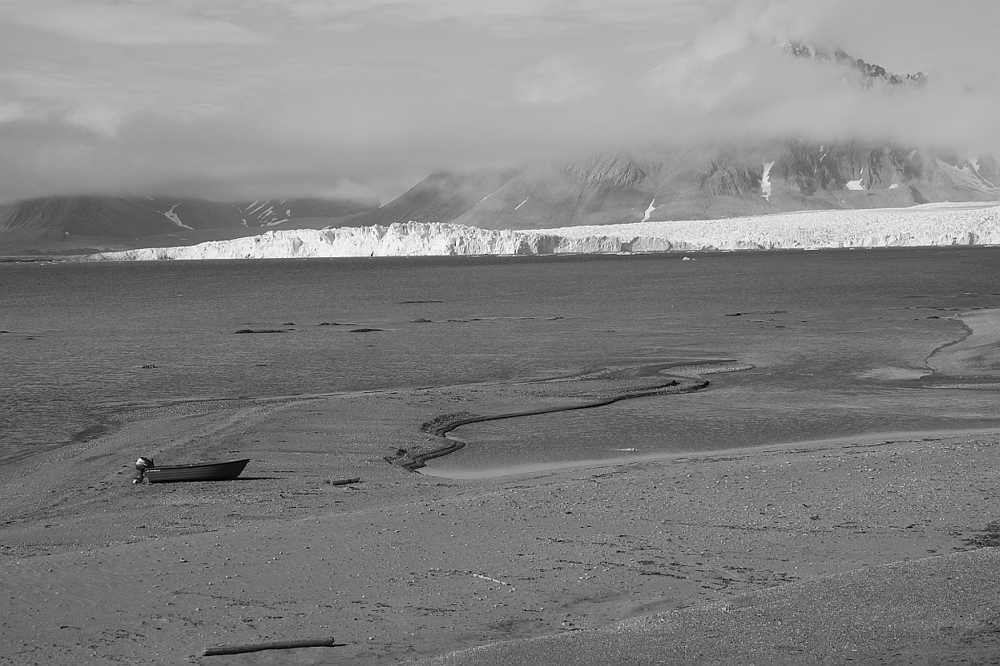

In [1168]:
Image.fromarray(np.uint8(img_np1))

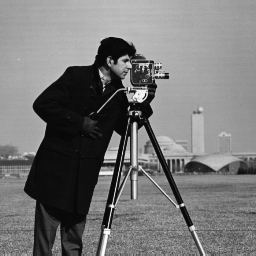

In [1169]:
Image.fromarray(np.uint8(img_np2))

## Metoda 1

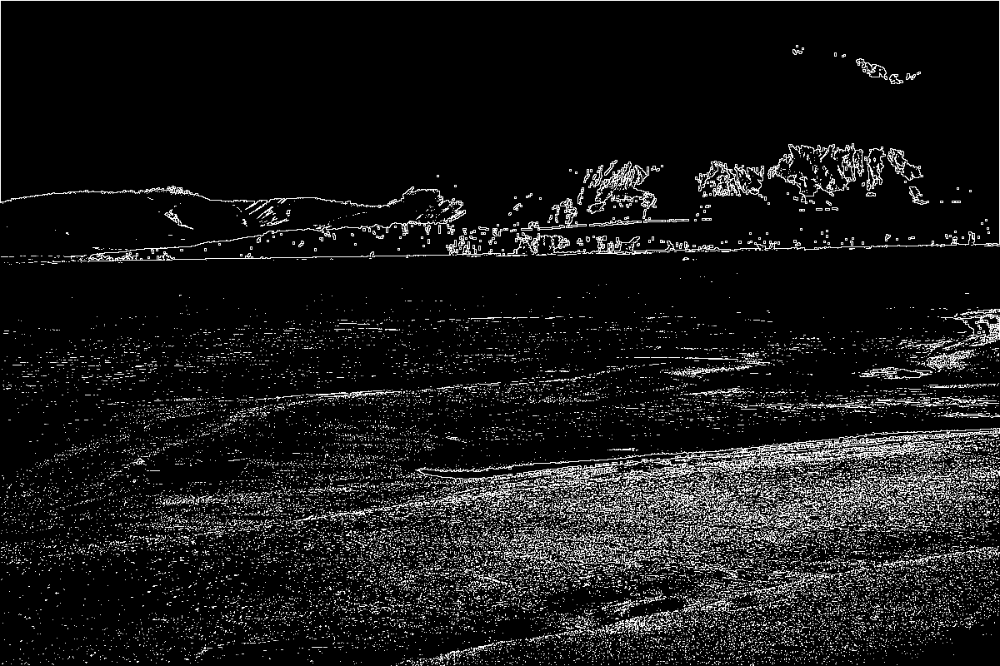

In [972]:
img1_erode = erode(img_np1)
gradient1_img1 = binarize(img_np1) - img1_erode
gradient1_img1 = Image.fromarray(np.uint8(gradient1_img1))
gradient1_img1

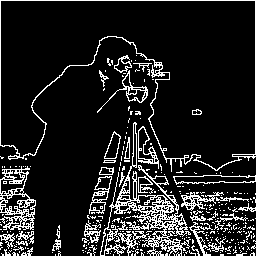

In [968]:
img2_erode = erode(img_np2)
gradient1_img2 = binarize(img_np2) - img2_erode
gradient1_img2 = Image.fromarray(np.uint8(gradient1_img2))
gradient1_img2

## Metoda 2

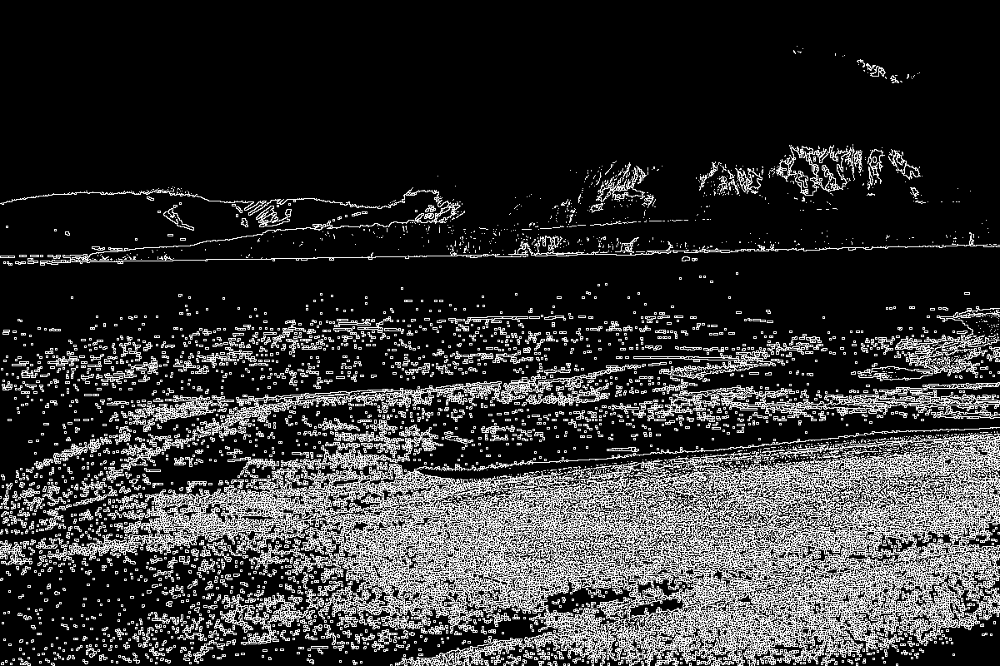

In [1150]:
img1_dilate = dilate(img_np1)
gradient2_img1 = img1_dilate - binarize(img_np1)
gradient2_img1 = Image.fromarray(np.uint8(gradient2_img1))
gradient2_img1

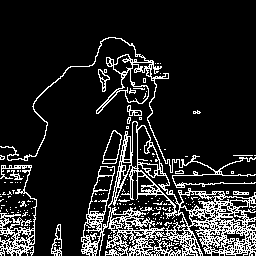

In [1151]:
img2_dilate = dilate(img_np2)
gradient2_img2 = img2_dilate - binarize(img_np2)
gradient2_img2 = Image.fromarray(np.uint8(gradient2_img2))
gradient2_img2

## Metoda 3

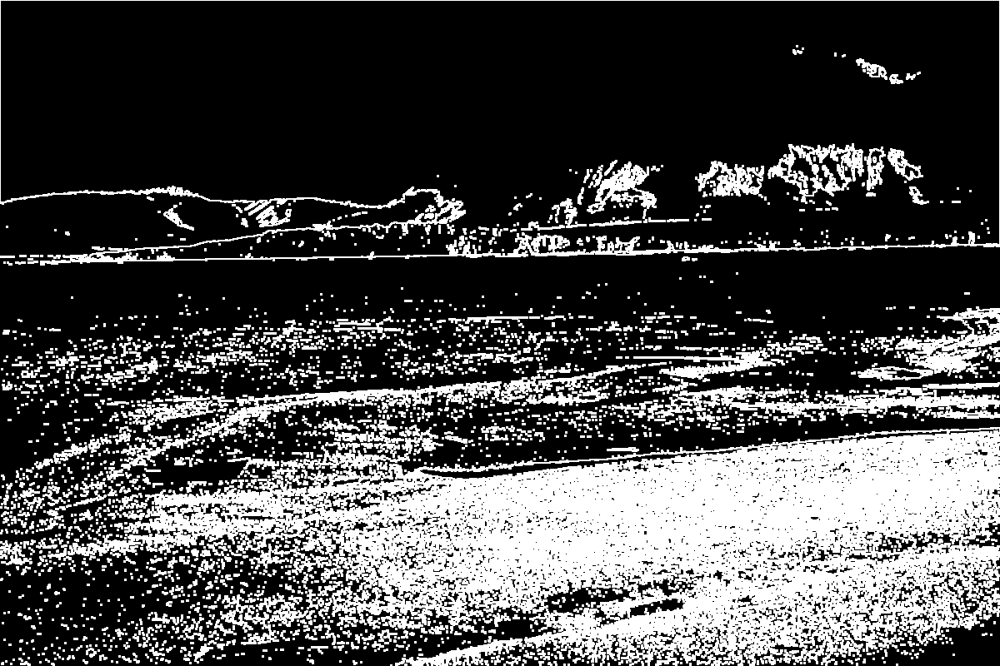

In [1152]:
gradient3_img1 = img1_dilate - img1_erode
gradient3_img1 = Image.fromarray(np.uint8(gradient3_img1))
gradient3_img1

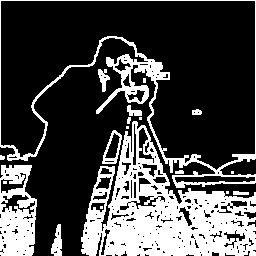

In [1153]:
gradient3_img2 = img2_dilate - img2_erode
gradient3_img2 = Image.fromarray(np.uint8(gradient3_img2))
gradient3_img2

# Wyrównywanie histogramu

In [1158]:
img1 = Image.open("/Users/arkadiuszdrag/Downloads/F_dzieciol.png")
img2 = Image.open("/Users/arkadiuszdrag/Downloads/sz_vimsodden.jpg")

In [ ]:
def cumulative_sum(l):
    cl = []
    s = 0

    for i in l:
        s += i
        cl.append(s)
    return cl

def normcdf(x, mu, sigma):
    t = x-mu;
    y = 0.5*erfcc(-t/(sigma*sqrt(2.0)));
    if y>1.0:
        y = 1.0;
    return y

In [704]:
def wyrownywanie_histogramu(img, n, sd):
    arr = []
    for i in np.arange(0, 1, 1/n):
        arr.append(i)

    img1 = img.copy()

    im_cumualtive = cumulative_sum(img1)

    zmieniony = []
    temp = 0

    maximum = img1.max()
    img1 = img1/img1.max()

    for i in arr:  
        prog = normcdf(i,0.5,sd)
        img1
        img1[(img1<  prog) & (img1 > temp)] = prog
        temp = prog

    wynik = img1*maximum
    
    return wynik

In [705]:
wyrownany1 = wyrownywanie_histogramu(img1, 14, 0.2)

In [708]:
wyrownany2 = wyrownywanie_histogramu(img2, 14, 0.2)

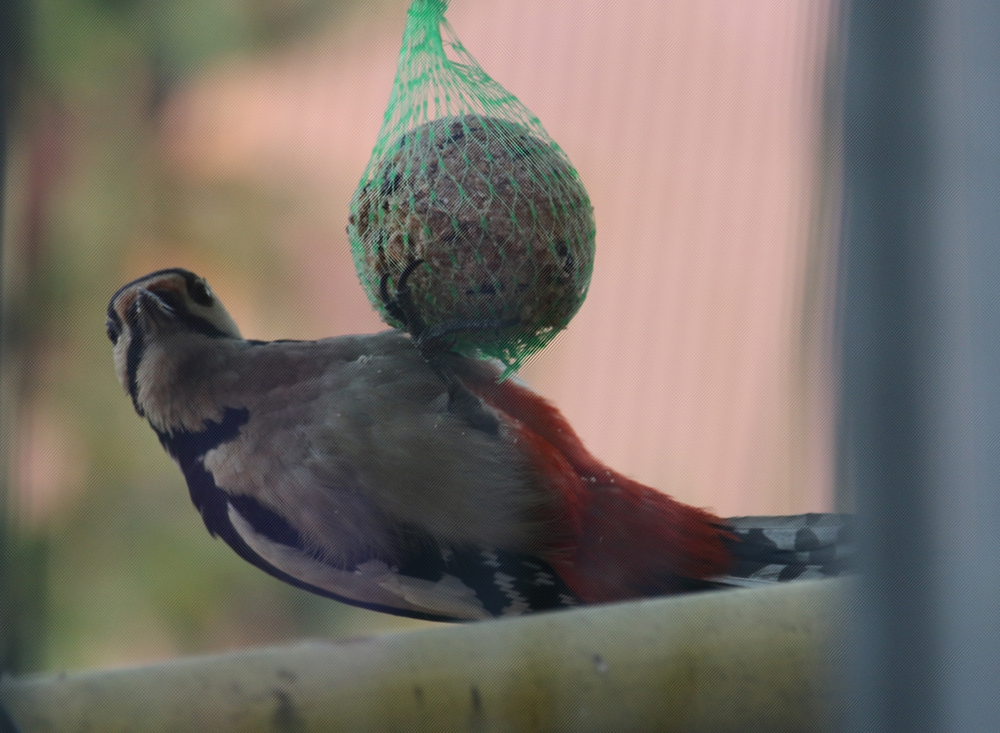

In [1159]:
Image.fromarray(np.uint8(img1))

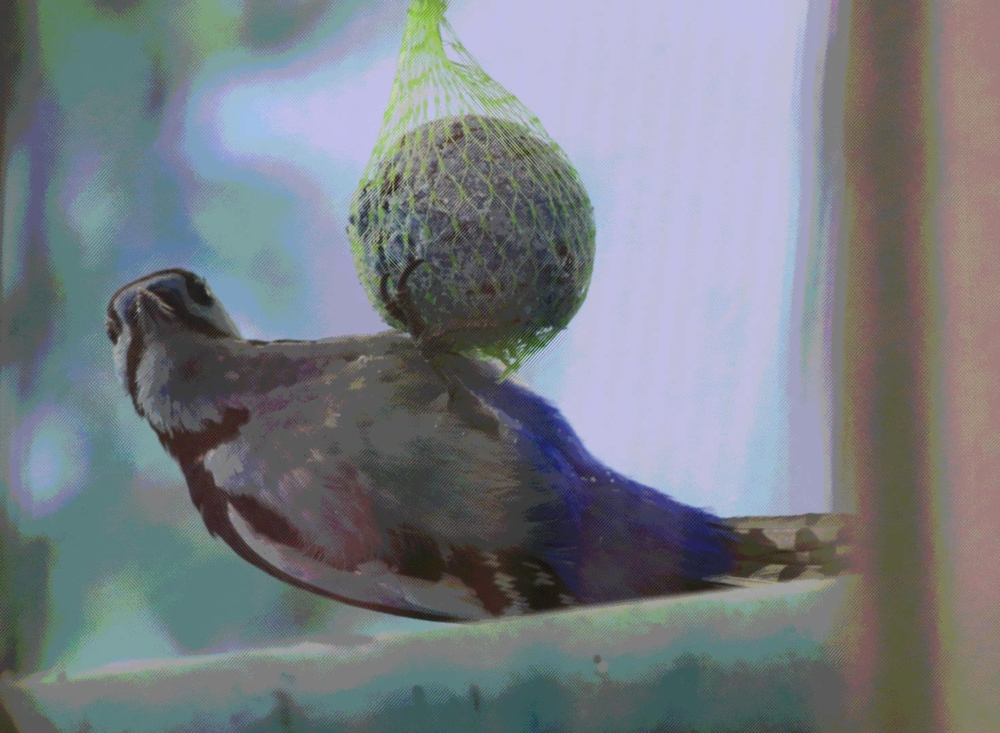

In [706]:
Image.fromarray(np.uint8(wyrownany1))

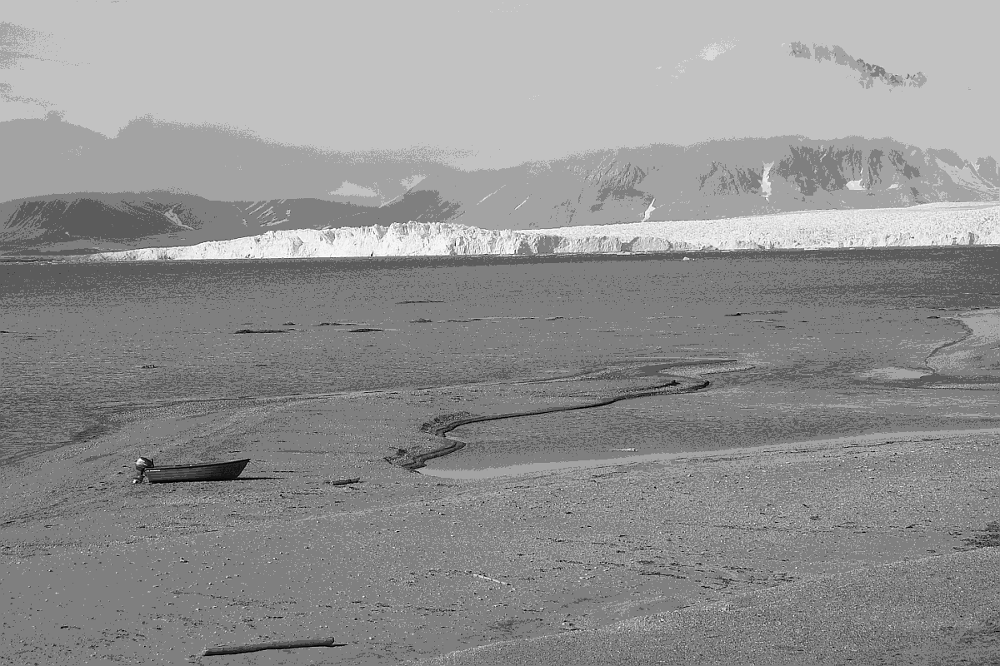

In [709]:
Image.fromarray(np.uint8(wyrownany2))

# Usuwanie elementow przecietych brzegiem

In [1155]:
img1 = Image.open("/Users/arkadiuszdrag/Downloads/unknown.png")

In [1156]:
img_np1 = binarize(np.array(img1))
np.shape(img_np1)

(256, 256)

In [1127]:
def del_on_edges(img):
    
    border = np.zeros(np.shape(img_np1))
    
    border[0,:] = img[0, :]
    border[-1, :] = img[-1, :]
    border[:, 0] = img[:, 0]
    border[:, -1] = img[:, -1]
    
    while True:
        temp = dilate(border) & img
        if np.array_equal(temp, border):
            break
        border = temp
    wynik = img - border
    return wynik

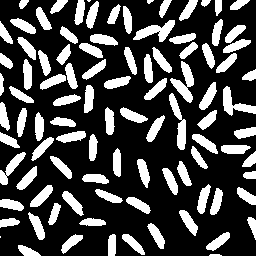

In [1157]:
Image.fromarray(np.uint8(img_np1))

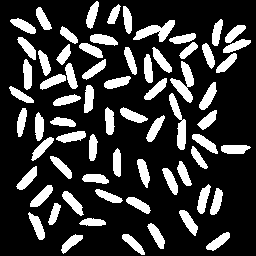

In [1128]:
Image.fromarray(np.uint8(del_on_edges(img_np1)))